In [1]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json
import os
from tqdm import tqdm, tqdm_notebook
import random

import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.applications import *
from tensorflow.keras.callbacks import *
from tensorflow.keras.initializers import *
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from numpy.random import seed
seed(1)
from tensorflow.keras.utils import set_random_seed
set_random_seed(1)

In [2]:
# df = pd.DataFrame(columns=['genre', 'paintings'])
# genre_folder = os.listdir('C:/Users/Stephanie Chung/Documents/NTUIM 2022 Fall/深度學習實作應用/Final Project/Wikiart_webcrawl/genre_data')
# root_path = r"C:/Users/Stephanie Chung/Documents/NTUIM 2022 Fall/深度學習實作應用/Final Project/Wikiart_webcrawl/genre_data/"
# cnt = 0
# for genre in genre_folder:
#     paintings = os.listdir(root_path + genre)
#     for num in paintings:
#         print(num)
#         original_file = os.path.join(root_path, genre, str(num))
#         new_name = genre +'_' +str(num)
#         dest_file = os.path.join(root_path, genre, new_name)
#         os.rename(original_file, dest_file)
#         # print(dest_file)
# #     df.loc[cnt] = [genre, paintings]
# #     cnt += 1
# # df

In [3]:
# import os, random, shutil
# def moveFile(fileDir):
#   pathDir = os.listdir(fileDir)
#   for i in pathDir:
#             Dir = os.listdir('/content/drive/MyDrive/images/'+str(i))    #取圖片的原始路徑
#             filenumber=len(Dir)
#             print(filenumber)
#             rate=0.1    #自定義抽取圖片的比例，比方說100張抽10張，那就是0.1
#             picknumber=int(filenumber*rate) #按照rate比例從資料夾中取一定數量圖片
#             sample = random.sample(Dir, picknumber)  #隨機選取picknumber數量的樣本圖片
#             print (sample)
#             for name in sample:
#                    shutil.move('/content/drive/MyDrive/images/'+i+'/'+name, '/content/drive/MyDrive/images/test/'+name)
#             # return
 
# if __name__ == '__main__':
#      fileDir = "/content/drive/MyDrive/images/"    #源圖片資料夾路徑
#      tarDir = '/content/drive/MyDrive/images/test/'    #移動到新的資料夾路徑
#      moveFile(fileDir)   

In [4]:
root_path = r'C:\Users\Stephanie Chung\Documents\NTUIM 2022 Fall\DLA\Final Project\Wikiart_webcrawl\genre_data'
root_folder = os.listdir(root_path)
genre_df = pd.DataFrame(columns=['genre','paintings'])
cnt = 0
for genre in root_folder:
    paintings = len(os.listdir(root_path + '/' + genre))
    genre_df.loc[cnt] = [genre, paintings]
    cnt += 1
genre_df

,genre,paintings
0,Abstract_Expressionism,324
1,Baroque,270
2,Cubism,324
3,Early_Renaissance,324
4,Expressionism,315
5,High_Renaissance,324
6,Impressionism,247
7,Mannerism,324
8,Northern_Renaissance,233
9,Pop_Art,324


In [5]:
# Sort artists by number of paintings
genre_df = genre_df.sort_values(by=['paintings'], ascending=False)

genre_df['class_weight'] = genre_df.paintings.sum() / (genre_df.shape[0] * genre_df.paintings)
genre_df

,genre,paintings,class_weight
0,Abstract_Expressionism,324,0.945171
7,Mannerism,324,0.945171
15,Surrealism,324,0.945171
12,Proto_Renaissance,324,0.945171
11,Primitivism,324,0.945171
9,Pop_Art,324,0.945171
16,Symbolism,324,0.945171
5,High_Renaissance,324,0.945171
3,Early_Renaissance,324,0.945171
2,Cubism,324,0.945171


In [6]:
# use_list = ['Pop_Art','Expressionism']
# # use_list = ['Pop_Art','Impressionism','Baroque']
# genre_2 = genre_df[genre_df['genre'].isin(use_list)]
genre_df.shape

(17, 3)

In [7]:
# Augment data
batch_size = 8
train_input_shape = (224, 224, 3)
n_classes = genre_df.shape[0]
images_dir = root_path
train_datagen = ImageDataGenerator(validation_split=0.2,
                                   rescale=1./255.,
                                   #rotation_range=45,
                                   #width_shift_range=0.5,
                                   #height_shift_range=0.5,
                                #    shear_range=5,
                                   #zoom_range=0.7,
                                #    horizontal_flip=True,
                                #    vertical_flip=True,
                                  )

train_generator = train_datagen.flow_from_directory(directory=images_dir,
                                                    class_mode='categorical',
                                                    target_size=train_input_shape[0:2],
                                                    batch_size=batch_size,
                                                    subset="training",
                                                    shuffle=True,
                                                    classes=genre_df['genre'].tolist()
                                                   )

valid_generator = train_datagen.flow_from_directory(directory=images_dir,
                                                    class_mode='categorical',
                                                    target_size=train_input_shape[0:2],
                                                    batch_size=batch_size,
                                                    subset="validation",
                                                    shuffle=True,
                                                    classes=genre_df['genre'].tolist()
                                                   )

STEP_SIZE_TRAIN = train_generator.n//train_generator.batch_size
STEP_SIZE_VALID = valid_generator.n//valid_generator.batch_size
print("Total number of batches =", STEP_SIZE_TRAIN, "and", STEP_SIZE_VALID)

Found 4175 images belonging to 17 classes.
Found 1031 images belonging to 17 classes.
Total number of batches = 521 and 128


### ResNet

In [8]:
import json
import math
import os

import cv2
from PIL import Image
import numpy as np
from keras import layers
from keras.callbacks import Callback, ModelCheckpoint
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import cohen_kappa_score, accuracy_score
import scipy
import tensorflow as tf
from tqdm import tqdm

%matplotlib inline

## DenseNet 121

In [61]:
from keras.applications.densenet import DenseNet121
densenet = DenseNet121(
    weights='../Wikiart_webcrawl/weights/DenseNet-BC-121-32-no-top.h5',
    include_top=False,
    input_shape=(224,224,3)
)

In [62]:
def build_model():
    model = Sequential()
    model.add(densenet)
    model.add(layers.GlobalAveragePooling2D())
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(17, activation='softmax'))
    
    optimizer = Adam(lr=0.0001)
    model.compile(loss='categorical_crossentropy',
                optimizer=optimizer, 
                metrics=['accuracy'])
    
    return model

In [63]:
model = build_model()
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet121 (Functional)    (None, 7, 7, 1024)        7037504   
                                                                 
 global_average_pooling2d_3   (None, 1024)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_3 (Dropout)         (None, 1024)              0         
                                                                 
 dense_3 (Dense)             (None, 17)                17425     
                                                                 
Total params: 7,054,929
Trainable params: 6,971,281
Non-trainable params: 83,648
_________________________________________________________________


c:\Users\Stephanie Chung\anaconda3\envs\tf-gpu\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [13]:
early_stop = EarlyStopping(monitor='val_loss', patience=10, verbose=1, 
                           mode='auto', restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, 
                              verbose=1, mode='auto')

In [65]:
# Train the model - all layers
densenet = model.fit_generator(generator=train_generator, steps_per_epoch=STEP_SIZE_TRAIN,
                              validation_data=valid_generator, validation_steps=STEP_SIZE_VALID,
                              epochs=500,
                              shuffle=True,
                              verbose=1,                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            
                              callbacks=[reduce_lr, early_stop],
                            #   use_multiprocessing=True,
                              workers=16,
                              # class_weight=class_weights_100
                             )

C:\Users\STEPHA~1\AppData\Local\Temp/ipykernel_23300/3703470785.py:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  densenet = model.fit_generator(generator=train_generator, steps_per_epoch=STEP_SIZE_TRAIN,


Epoch 1/500
521/521 [==============================] - ETA: 0s - loss: 2.5485 - accuracy: 0.2517

c:\Users\Stephanie Chung\anaconda3\envs\tf-gpu\lib\site-packages\PIL\TiffImagePlugin.py:822: UserWarning: Corrupt EXIF data.  Expecting to read 2 bytes but only got 0. 
  warnings.warn(str(msg))


521/521 [==============================] - 105s 181ms/step - loss: 2.5485 - accuracy: 0.2517 - val_loss: 1.7919 - val_accuracy: 0.4326 - lr: 1.0000e-04
Epoch 2/500
521/521 [==============================] - 96s 183ms/step - loss: 1.7695 - accuracy: 0.4440 - val_loss: 1.4978 - val_accuracy: 0.5146 - lr: 1.0000e-04
Epoch 3/500
521/521 [==============================] - 95s 182ms/step - loss: 1.3532 - accuracy: 0.5647 - val_loss: 1.6400 - val_accuracy: 0.4990 - lr: 1.0000e-04
Epoch 4/500
521/521 [==============================] - 110s 210ms/step - loss: 1.0533 - accuracy: 0.6638 - val_loss: 1.5540 - val_accuracy: 0.5420 - lr: 1.0000e-04
Epoch 5/500
521/521 [==============================] - 144s 276ms/step - loss: 0.8047 - accuracy: 0.7377 - val_loss: 1.9590 - val_accuracy: 0.5039 - lr: 1.0000e-04
Epoch 6/500
521/521 [==============================] - 95s 182ms/step - loss: 0.5940 - accuracy: 0.8044 - val_loss: 2.0673 - val_accuracy: 0.4902 - lr: 1.0000e-04
Epoch 7/500
521/521 [==========

In [26]:
datagen = ImageDataGenerator(rescale=1./255.)
# In ./dataset directory, there is `test` directory.
test_path = r'C:\Users\Stephanie Chung\Documents\NTUIM 2022 Fall\DLA\Final Project\Wikiart_webcrawl\test'
test_data_gen = datagen.flow_from_directory(test_path, 
                                        class_mode='categorical',
                                        target_size=train_input_shape[0:2],
                                        batch_size=batch_size,
                                        
                                        shuffle=True,
                                        classes=genre_df['genre'].tolist())
STEP_SIZE_TEST = test_data_gen.n//test_data_gen.batch_size
print("Total number of batches =", STEP_SIZE_TEST)

Found 570 images belonging to 17 classes.
Total number of batches = 142


y pred [array([[1.80313837e-05, 3.36791049e-06, 5.67176603e-02, 8.74688681e-07,
        2.24783187e-04, 9.42654848e-01, 1.41509017e-05, 3.28976125e-06,
        2.13767635e-05, 1.52441162e-05, 3.28145484e-06, 2.63975729e-04,
        3.19335118e-06, 1.21482049e-06, 9.23992411e-06, 4.46879385e-05,
        9.12985854e-07],
       [1.54077485e-01, 3.79257719e-04, 1.12262636e-01, 2.25663025e-04,
        6.69647455e-01, 2.10438799e-02, 9.28538386e-03, 1.34873623e-03,
        5.53345191e-04, 2.27131858e-03, 2.80419295e-03, 1.53448228e-02,
        9.70979745e-04, 5.38687780e-03, 1.44863885e-03, 2.40971451e-03,
        5.39534551e-04],
       [8.54064092e-06, 1.77535607e-04, 1.55273126e-03, 1.88563485e-04,
        1.23181730e-03, 8.60342872e-04, 2.80456198e-03, 4.77788242e-04,
        8.74286052e-04, 3.05152589e-05, 2.56447564e-03, 9.84164894e-01,
        1.25379869e-04, 2.61535461e-04, 3.72223277e-03, 4.08620923e-04,
        5.46188036e-04],
       [3.51748705e-01, 1.66223664e-02, 8.44688714e-0

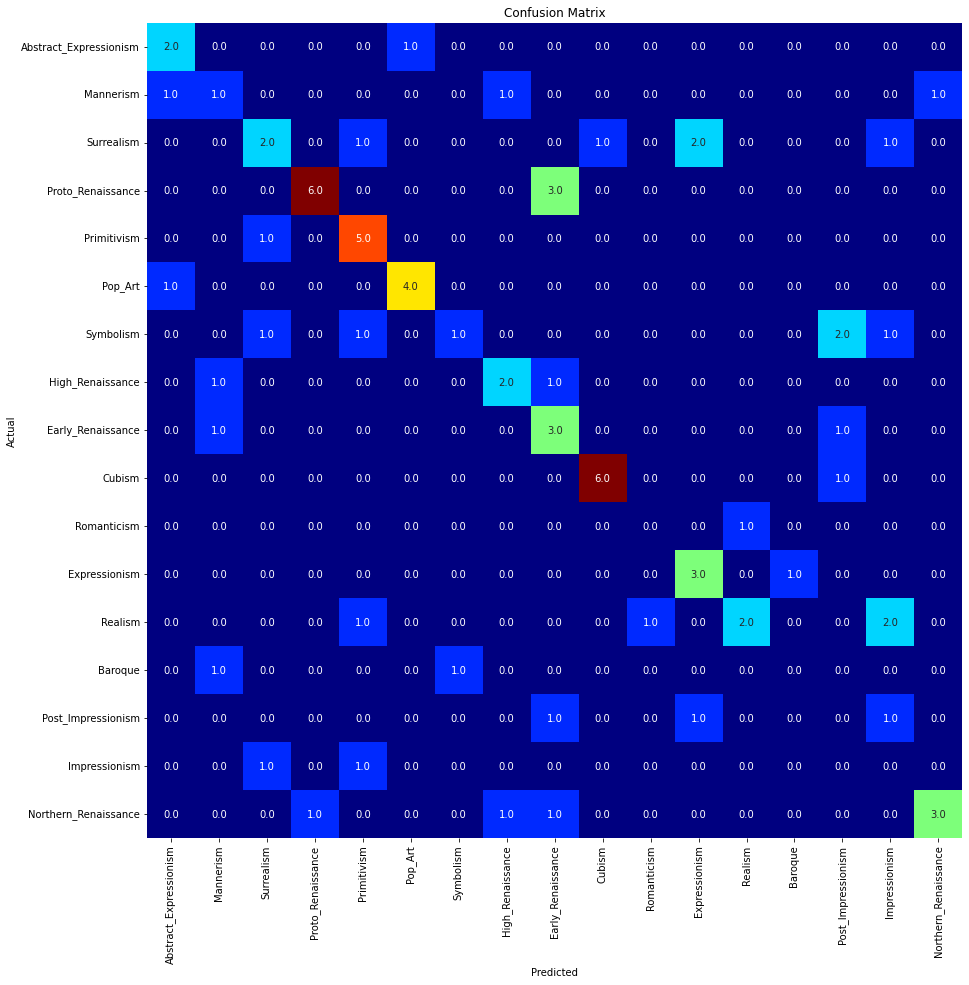

Classification Report:
                        precision    recall  f1-score   support

Abstract_Expressionism       0.50      0.67      0.57         3
             Mannerism       0.25      0.25      0.25         4
            Surrealism       0.40      0.29      0.33         7
     Proto_Renaissance       0.86      0.67      0.75         9
           Primitivism       0.56      0.83      0.67         6
               Pop_Art       0.80      0.80      0.80         5
             Symbolism       0.50      0.17      0.25         6
      High_Renaissance       0.50      0.50      0.50         4
     Early_Renaissance       0.33      0.60      0.43         5
                Cubism       0.86      0.86      0.86         7
           Romanticism       0.00      0.00      0.00         1
         Expressionism       0.50      0.75      0.60         4
               Realism       0.67      0.33      0.44         6
               Baroque       0.00      0.00      0.00         2
    Post_Impress

In [67]:
# Classification report and confusion matrix
from sklearn.metrics import *
import seaborn as sns
from PIL import Image
from PIL import ImageFile

Image.MAX_IMAGE_PIXELS = None
ImageFile.LOAD_TRUNCATED_IMAGES = True


def showClassficationReport_Generator(model, valid_generator, STEP_SIZE_VALID):
    # Loop on each generator batch and predict
    y_pred, y_true = [], []
    for i in range(10):
        (X,y) = next(valid_generator)
        y_pred.append(model.predict(X))
        y_true.append(y)
    print("y pred",y_pred)
    print("y true",y_true)
    # Create a flat list for y_true and y_pred
    y_pred = [subresult for result in y_pred for subresult in result]
    y_true = [subresult for result in y_true for subresult in result]
    
    # Update Truth vector based on argmax
    y_true = np.argmax(y_true, axis=1)
    y_true = np.asarray(y_true).ravel()
    
    # Update Prediction vector based on argmax
    y_pred = np.argmax(y_pred, axis=1)
    y_pred = np.asarray(y_pred).ravel()
    
    # Confusion Matrix
    fig, ax = plt.subplots(figsize=(15,15))
    conf_matrix = confusion_matrix(y_true, y_pred, labels=np.arange(17))
    # conf_matrix = conf_matrix/np.sum(conf_matrix, axis=1)
    sns.heatmap(conf_matrix, annot=True, fmt=".1f", square=True, cbar=False, 
                cmap=plt.cm.jet, xticklabels=genre_df['genre'].tolist(), yticklabels=genre_df['genre'].tolist(),
                ax=ax)
    ax.set_ylabel('Actual')
    ax.set_xlabel('Predicted')
    ax.set_title('Confusion Matrix')
    plt.show()

    
    print('Classification Report:')
    print(classification_report(y_true, y_pred, labels=np.arange(17), target_names=genre_df['genre'].tolist()))

showClassficationReport_Generator(model, test_data_gen, STEP_SIZE_TEST)

In [68]:
model.save('DenseNet1210.h5')

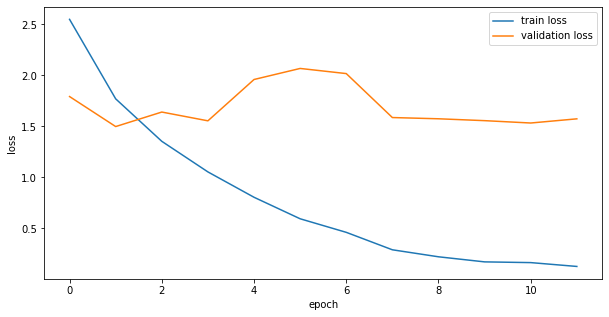

In [72]:
plt.figure(figsize=(10,5), linewidth = 2)
plt.plot(densenet.epoch, densenet.history['loss'], label = 'train loss')
plt.plot(densenet.epoch, densenet.history['val_loss'], label = 'validation loss')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend()
plt.show()

# plt.figure(figsize=(10,5), linewidth = 2)

# plt.xlabel('epoch')
# plt.ylabel('loss')
# plt.legend()
# plt.show()

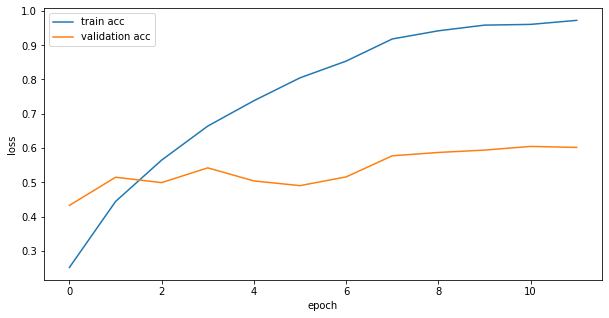

In [73]:
plt.figure(figsize=(10,5), linewidth = 2)
plt.plot(densenet.epoch, densenet.history['accuracy'], label = 'train acc')
plt.plot(densenet.epoch, densenet.history['val_accuracy'], label = 'validation acc')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend()
plt.show()


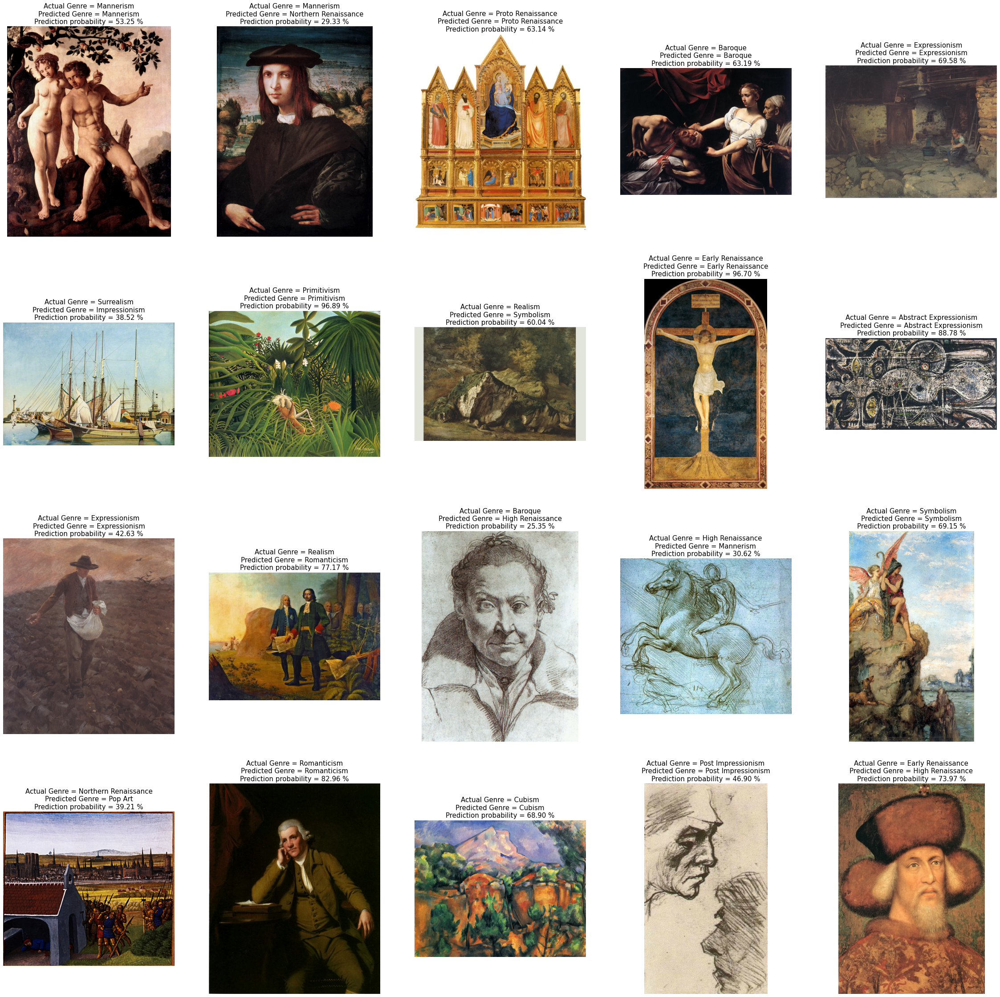

0.6


In [75]:
# Prediction
from keras.preprocessing import *

count = 0
n = 5
m = 4
fig, axes = plt.subplots(m, n, figsize=(40,40))
test_dir = r'C:\Users\Stephanie Chung\Documents\NTUIM 2022 Fall\DLA\Final Project\Wikiart_webcrawl\test'

f = os.listdir(test_dir)
# for i in f:
    # image = './images/test/'
    # a = os.listdir(os.path.join('./images/test/'+str(i)))

for j in range(m):
    for i in range(n):
        random_artist = random.choice(genre_df['genre'])
        random_image = random.choice(os.listdir(os.path.join(test_dir, random_artist)))
        random_image_file = os.path.join(test_dir, random_artist, random_image)

            # Original image

        test_image = tf.keras.utils.load_img(random_image_file, target_size=(train_input_shape[0:2]))

            # Predict artist
        test_image = tf.keras.utils.img_to_array(test_image)
        test_image /= 255.
        test_image = np.expand_dims(test_image, axis=0)

        prediction = model.predict(test_image)
        prediction_probability = np.amax(prediction)
        prediction_idx = np.argmax(prediction)

        labels = train_generator.class_indices
        labels = dict((v,k) for k,v in labels.items())

            #print("Actual artist =", random_artist.replace('_', ' '))
            #print("Predicted artist =", labels[prediction_idx].replace('_', ' '))
            #print("Prediction probability =", prediction_probability*100, "%")

        title = "Actual Genre = {}\nPredicted Genre = {}\nPrediction probability = {:.2f} %" \
                        .format(random_artist.replace('_', ' '), labels[prediction_idx].replace('_', ' '),
                                prediction_probability*100)

            # Print image
        axes[j][i].imshow(plt.imread(random_image_file))
        axes[j][i].set_title(title, fontsize=15)
        axes[j][i].axis('off')

        if random_artist.replace('_', ' ') == labels[prediction_idx].replace('_', ' '):
            count += 1

plt.show()
print(count/(n*m))

weight_resource = https://www.kaggle.com/datasets/xhlulu/densenet-keras

## DenseNet169

In [15]:
from keras.applications.densenet import DenseNet169
densenet = DenseNet169(
   include_top=False,
    weights='imagenet',
    input_shape=(224,224,3)
)

51888128/51877672 [==============================] - 2s 0us/step


In [16]:
def build_model():
    model = Sequential()
    model.add(densenet)
    model.add(layers.GlobalAveragePooling2D())
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(17, activation='softmax'))
    
    optimizer = Adam(lr=0.0001)
    model.compile(loss='categorical_crossentropy',
                optimizer=optimizer, 
                metrics=['accuracy'])
    
    return model

In [17]:
model = build_model()
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet169 (Functional)    (None, 7, 7, 1664)        12642880  
                                                                 
 global_average_pooling2d_1   (None, 1664)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_1 (Dropout)         (None, 1664)              0         
                                                                 
 dense_1 (Dense)             (None, 17)                28305     
                                                                 
Total params: 12,671,185
Trainable params: 12,512,785
Non-trainable params: 158,400
_________________________________________________________________


c:\Users\Stephanie Chung\anaconda3\envs\tf-gpu\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [19]:
# Augment data
batch_size = 4
train_input_shape = (224, 224, 3)
n_classes = genre_df.shape[0]
images_dir = root_path
train_datagen = ImageDataGenerator(validation_split=0.2,
                                   rescale=1./255.,
                                   #rotation_range=45,
                                   #width_shift_range=0.5,
                                   #height_shift_range=0.5,
                                #    shear_range=5,
                                   #zoom_range=0.7,
                                #    horizontal_flip=True,
                                #    vertical_flip=True,
                                  )

train_generator = train_datagen.flow_from_directory(directory=images_dir,
                                                    class_mode='categorical',
                                                    target_size=train_input_shape[0:2],
                                                    batch_size=batch_size,
                                                    subset="training",
                                                    shuffle=True,
                                                    classes=genre_df['genre'].tolist()
                                                   )

valid_generator = train_datagen.flow_from_directory(directory=images_dir,
                                                    class_mode='categorical',
                                                    target_size=train_input_shape[0:2],
                                                    batch_size=batch_size,
                                                    subset="validation",
                                                    shuffle=True,
                                                    classes=genre_df['genre'].tolist()
                                                   )

STEP_SIZE_TRAIN = train_generator.n//train_generator.batch_size
STEP_SIZE_VALID = valid_generator.n//valid_generator.batch_size
print("Total number of batches =", STEP_SIZE_TRAIN, "and", STEP_SIZE_VALID)

Found 4175 images belonging to 17 classes.
Found 1031 images belonging to 17 classes.
Total number of batches = 1043 and 257


In [20]:
# Train the model - all layers
densenet = model.fit_generator(generator=train_generator, steps_per_epoch=STEP_SIZE_TRAIN,
                              validation_data=valid_generator, validation_steps=STEP_SIZE_VALID,
                              epochs=500,
                              shuffle=True,
                              verbose=1,                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            
                              callbacks=[reduce_lr, early_stop],
                            #   use_multiprocessing=True,
                              workers=16,
                              # class_weight=class_weights_100
                             )

Epoch 1/500


C:\Users\STEPHA~1\AppData\Local\Temp/ipykernel_1804/3703470785.py:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  densenet = model.fit_generator(generator=train_generator, steps_per_epoch=STEP_SIZE_TRAIN,


1043/1043 [==============================] - ETA: 0s - loss: 2.4149 - accuracy: 0.2620

c:\Users\Stephanie Chung\anaconda3\envs\tf-gpu\lib\site-packages\PIL\TiffImagePlugin.py:822: UserWarning: Corrupt EXIF data.  Expecting to read 2 bytes but only got 0. 
  warnings.warn(str(msg))


1043/1043 [==============================] - 180s 168ms/step - loss: 2.4149 - accuracy: 0.2620 - val_loss: 1.8715 - val_accuracy: 0.4202 - lr: 1.0000e-04
Epoch 2/500
1043/1043 [==============================] - 169s 162ms/step - loss: 1.8805 - accuracy: 0.4025 - val_loss: 1.7903 - val_accuracy: 0.4786 - lr: 1.0000e-04
Epoch 3/500
1043/1043 [==============================] - 176s 169ms/step - loss: 1.5745 - accuracy: 0.4977 - val_loss: 1.8352 - val_accuracy: 0.5126 - lr: 1.0000e-04
Epoch 4/500
1043/1043 [==============================] - 188s 180ms/step - loss: 1.3108 - accuracy: 0.5871 - val_loss: 1.8124 - val_accuracy: 0.5272 - lr: 1.0000e-04
Epoch 5/500
1043/1043 [==============================] - 182s 174ms/step - loss: 1.0506 - accuracy: 0.6735 - val_loss: 2.3108 - val_accuracy: 0.5088 - lr: 1.0000e-04
Epoch 6/500
1043/1043 [==============================] - 183s 176ms/step - loss: 0.8461 - accuracy: 0.7344 - val_loss: 2.5002 - val_accuracy: 0.4630 - lr: 1.0000e-04
Epoch 7/500
1043

In [21]:
model.save('fensr139.h5')

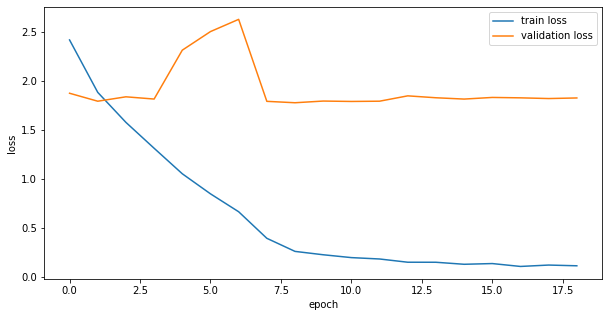

In [22]:
plt.figure(figsize=(10,5), linewidth = 2)
plt.plot(densenet.epoch, densenet.history['loss'], label = 'train loss')
plt.plot(densenet.epoch, densenet.history['val_loss'], label = 'validation loss')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend()
plt.show()

# plt.figure(figsize=(10,5), linewidth = 2)

# plt.xlabel('epoch')
# plt.ylabel('loss')
# plt.legend()
# plt.show()

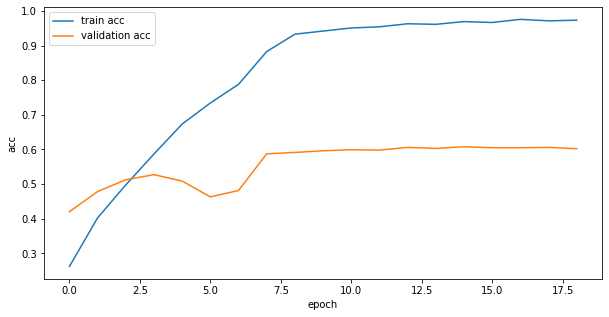

In [24]:
plt.figure(figsize=(10,5), linewidth = 2)
plt.plot(densenet.epoch, densenet.history['accuracy'], label = 'train acc')
plt.plot(densenet.epoch, densenet.history['val_accuracy'], label = 'validation acc')
plt.xlabel('epoch')
plt.ylabel('acc')
plt.legend()
plt.show()


y pred [array([[1.04566300e-10, 2.03098425e-05, 1.44629109e-08, 7.32894421e-07,
        9.99970794e-01, 1.63986647e-06, 3.61436614e-09, 1.06556513e-06,
        4.49247551e-07, 2.27839259e-08, 1.55828531e-07, 8.95322128e-09,
        6.11625808e-08, 1.10369847e-07, 1.27141703e-07, 4.44597345e-06,
        5.65188651e-09],
       [2.36637279e-04, 5.14899830e-06, 4.66511119e-05, 2.18753230e-05,
        3.22654285e-03, 8.20061076e-04, 1.74086809e-03, 7.91133498e-05,
        8.02618597e-05, 2.89707142e-03, 4.31177206e-02, 2.47694537e-01,
        7.09575862e-02, 7.23956009e-06, 6.24222815e-01, 4.84128436e-03,
        4.52175072e-06],
       [3.34473065e-04, 6.48364148e-05, 2.07557101e-02, 9.29225735e-06,
        7.55028714e-06, 2.22314906e-04, 2.09278171e-03, 3.16301058e-03,
        2.66868319e-05, 1.03493603e-02, 5.59182672e-06, 8.55416525e-03,
        6.73930801e-04, 1.36628503e-03, 9.51438189e-01, 5.08555153e-04,
        4.27145307e-04],
       [4.17614729e-06, 1.18414710e-06, 1.43656644e-0

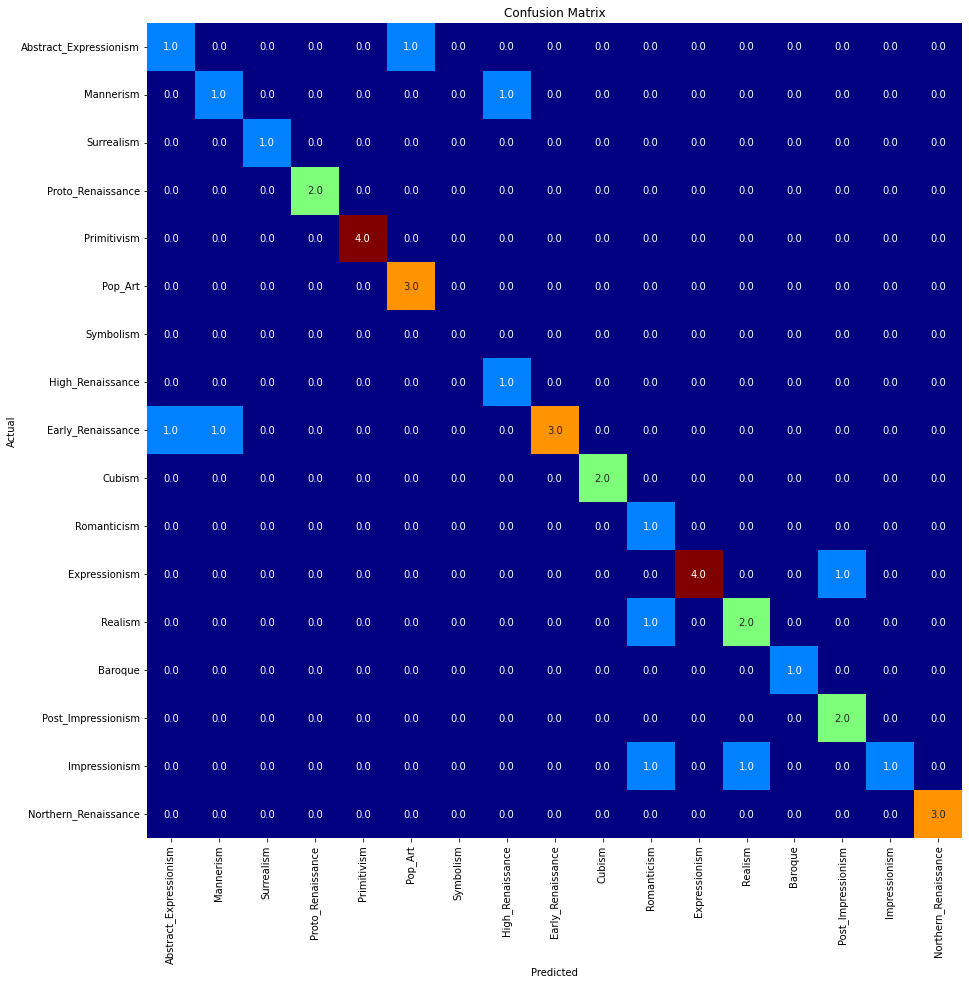

Classification Report:
                        precision    recall  f1-score   support

Abstract_Expressionism       0.50      0.50      0.50         2
             Mannerism       0.50      0.50      0.50         2
            Surrealism       1.00      1.00      1.00         1
     Proto_Renaissance       1.00      1.00      1.00         2
           Primitivism       1.00      1.00      1.00         4
               Pop_Art       0.75      1.00      0.86         3
             Symbolism       0.00      0.00      0.00         0
      High_Renaissance       0.50      1.00      0.67         1
     Early_Renaissance       1.00      0.60      0.75         5
                Cubism       1.00      1.00      1.00         2
           Romanticism       0.33      1.00      0.50         1
         Expressionism       1.00      0.80      0.89         5
               Realism       0.67      0.67      0.67         3
               Baroque       1.00      1.00      1.00         1
    Post_Impress

c:\Users\Stephanie Chung\anaconda3\envs\tf-gpu\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Stephanie Chung\anaconda3\envs\tf-gpu\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Stephanie Chung\anaconda3\envs\tf-gpu\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result

In [27]:
# Classification report and confusion matrix
from sklearn.metrics import *
import seaborn as sns
from PIL import Image
from PIL import ImageFile

Image.MAX_IMAGE_PIXELS = None
ImageFile.LOAD_TRUNCATED_IMAGES = True


def showClassficationReport_Generator(model, valid_generator, STEP_SIZE_VALID):
    # Loop on each generator batch and predict
    y_pred, y_true = [], []
    for i in range(10):
        (X,y) = next(valid_generator)
        y_pred.append(model.predict(X))
        y_true.append(y)
    print("y pred",y_pred)
    print("y true",y_true)
    # Create a flat list for y_true and y_pred
    y_pred = [subresult for result in y_pred for subresult in result]
    y_true = [subresult for result in y_true for subresult in result]
    
    # Update Truth vector based on argmax
    y_true = np.argmax(y_true, axis=1)
    y_true = np.asarray(y_true).ravel()
    
    # Update Prediction vector based on argmax
    y_pred = np.argmax(y_pred, axis=1)
    y_pred = np.asarray(y_pred).ravel()
    
    # Confusion Matrix
    fig, ax = plt.subplots(figsize=(15,15))
    conf_matrix = confusion_matrix(y_true, y_pred, labels=np.arange(17))
    # conf_matrix = conf_matrix/np.sum(conf_matrix, axis=1)
    sns.heatmap(conf_matrix, annot=True, fmt=".1f", square=True, cbar=False, 
                cmap=plt.cm.jet, xticklabels=genre_df['genre'].tolist(), yticklabels=genre_df['genre'].tolist(),
                ax=ax)
    ax.set_ylabel('Actual')
    ax.set_xlabel('Predicted')
    ax.set_title('Confusion Matrix')
    plt.show()

    
    print('Classification Report:')
    print(classification_report(y_true, y_pred, labels=np.arange(17), target_names=genre_df['genre'].tolist()))

showClassficationReport_Generator(model, test_data_gen, STEP_SIZE_TEST)

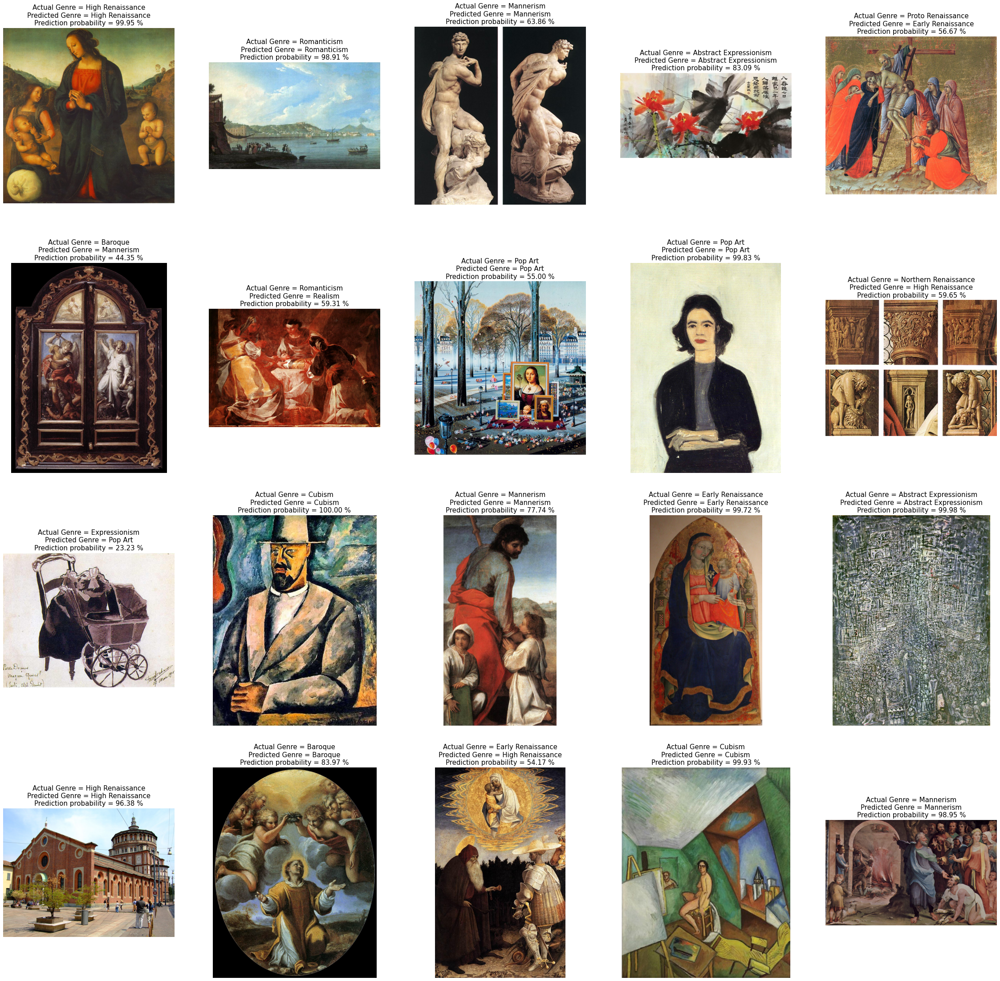

0.7


In [28]:
# Prediction
from keras.preprocessing import *

count = 0
n = 5
m = 4
fig, axes = plt.subplots(m, n, figsize=(40,40))
test_dir = r'C:\Users\Stephanie Chung\Documents\NTUIM 2022 Fall\DLA\Final Project\Wikiart_webcrawl\test'

f = os.listdir(test_dir)
# for i in f:
    # image = './images/test/'
    # a = os.listdir(os.path.join('./images/test/'+str(i)))

for j in range(m):
    for i in range(n):
        random_artist = random.choice(genre_df['genre'])
        random_image = random.choice(os.listdir(os.path.join(test_dir, random_artist)))
        random_image_file = os.path.join(test_dir, random_artist, random_image)

            # Original image

        test_image = tf.keras.utils.load_img(random_image_file, target_size=(train_input_shape[0:2]))

            # Predict artist
        test_image = tf.keras.utils.img_to_array(test_image)
        test_image /= 255.
        test_image = np.expand_dims(test_image, axis=0)

        prediction = model.predict(test_image)
        prediction_probability = np.amax(prediction)
        prediction_idx = np.argmax(prediction)

        labels = train_generator.class_indices
        labels = dict((v,k) for k,v in labels.items())

            #print("Actual artist =", random_artist.replace('_', ' '))
            #print("Predicted artist =", labels[prediction_idx].replace('_', ' '))
            #print("Prediction probability =", prediction_probability*100, "%")

        title = "Actual Genre = {}\nPredicted Genre = {}\nPrediction probability = {:.2f} %" \
                        .format(random_artist.replace('_', ' '), labels[prediction_idx].replace('_', ' '),
                                prediction_probability*100)

            # Print image
        axes[j][i].imshow(plt.imread(random_image_file))
        axes[j][i].set_title(title, fontsize=15)
        axes[j][i].axis('off')

        if random_artist.replace('_', ' ') == labels[prediction_idx].replace('_', ' '):
            count += 1

plt.show()
print(count/(n*m))